<a href="https://colab.research.google.com/github/arav7781/Data-Preprocessing/blob/main/FeatureAnalysis(ECB).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import pandas as pd

import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, LabelEncoder

# Load the dataset
file_path = '/content/crypto_dataset_ecb_mode.csv'
df = pd.read_csv(file_path)

# Display basic information about the dataset
print("Dataset Head:")
print(df.head())
print("\nDataset Info:")
print(df.info())
print("\nDataset Description:")
print(df.describe())

# Check for missing values
print("\nMissing Values:")
print(df.isnull().sum())

# Check for class distribution (assuming 'target' is the target variable)
if 'Algorithm' in df.columns:
    print("\nClass Distribution:")
    print(df['Algorithm'].value_counts())
else:
    print("\nTarget column not found, please specify the correct target variable.")


Dataset Head:
  Algorithm                                               Key  \
0       AES                  0c5389ebf79e440137aa56b858127820   
1       AES                  f18cd48ca64fdae6ae5617fb9fa80f79   
2      3DES  26fd5bf4c1ae913bab3dd6ba37ec8c7908d989cb012ccbfb   
3       AES                  41b0cd6142b8e7cc9445e794a997ae0d   
4      3DES  67310b9dcd1040e32ad55dd53483016e9b20e6e37654bc01   

                          Plaintext  \
0  ef4633f0e0749c33417f83fb8efbbebb   
1  3c2a5014586a98b89578b1b90358b1a2   
2  3d95c83631193b85e0bb770a93f92a40   
3  716568e1177cb7f37b3f6b8b9c9cffe2   
4  3f44fb869e474124234f9a9864016736   

                                          Ciphertext  Ciphertext Length  \
0  e24715a87ddb71854b3cb48949ff88f3198b2a4c144df3...                 32   
1  dc5914fd466630777677761df684110a1fae9eb65dd368...                 32   
2   ef2a121f33eebf7b753d3c89eddf08c94ace3ec0c07c5004                 24   
3  48d2c9b74ece7761e555ed8e93aad04db97d1fa2ecd76e...        


Missing Values:
Algorithm                      0
Key                            0
Plaintext                      0
Ciphertext                     0
Ciphertext Length              0
Byte Frequency Distribution    0
Byte Entropy                   0
N-gram Bigram Frequency        0
N-gram Trigram Frequency       0
Key Length Identification      0
Randomness Chi-Square          0
Randomness KS-Test             0
Hamming Distance               0
Byte Transition Matrix         0
Byte Frequency Ratio           0
Sequential Correlation         0
Pattern of Repeated Blocks     0
Unique Byte Count              0
Bit Size                       0
dtype: int64


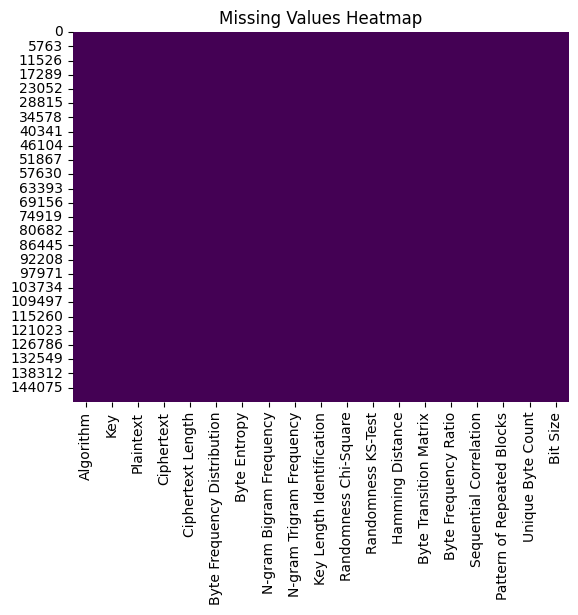

In [3]:
# Checking for missing values
missing_values = df.isnull().sum()
print("\nMissing Values:")
print(missing_values)

# Visualize missing values
sns.heatmap(df.isnull(), cbar=False, cmap='viridis')
plt.title('Missing Values Heatmap')
plt.show()


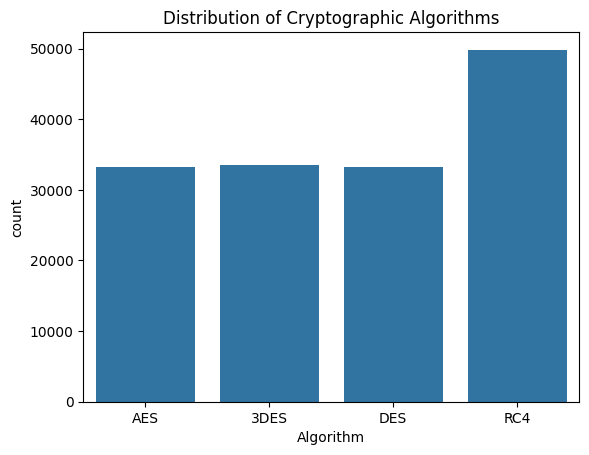


Class Distribution:
Algorithm
RC4     49828
3DES    33477
DES     33297
AES     33226
Name: count, dtype: int64


In [5]:
# Visualize the distribution of the target variable 'Algorithm'
sns.countplot(x='Algorithm', data=df)
plt.title('Distribution of Cryptographic Algorithms')
plt.show()

# Display the count of each class
print("\nClass Distribution:")
print(df['Algorithm'].value_counts())


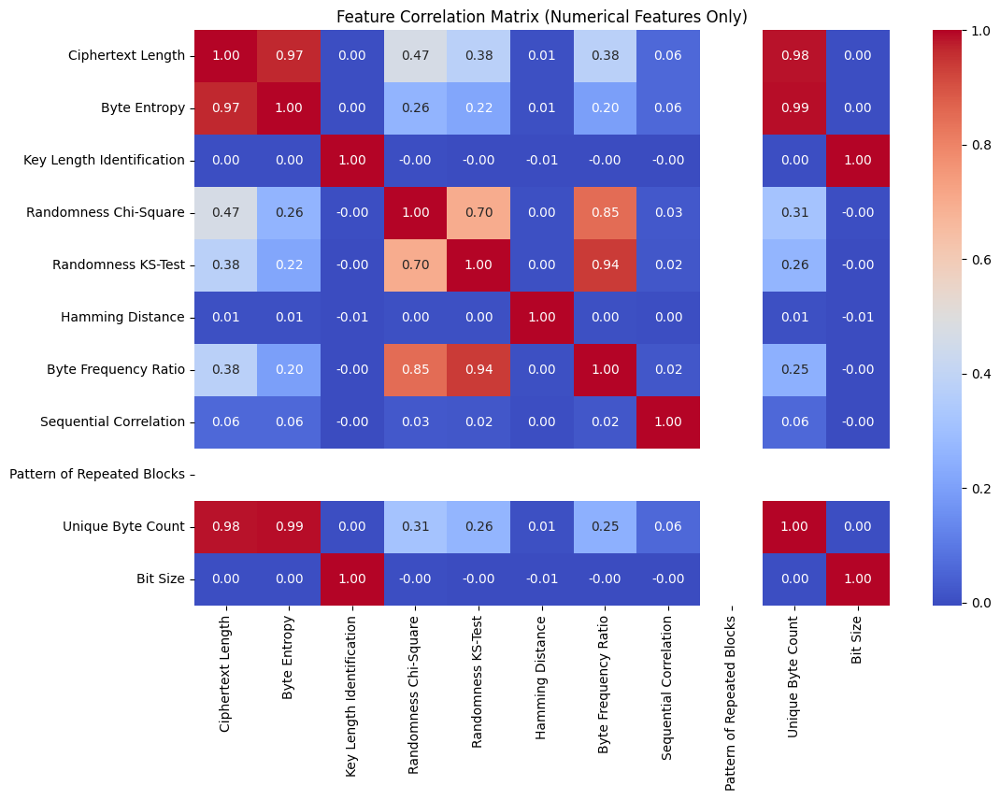


Correlation of Numerical Features with 'Ciphertext Length':
Ciphertext Length             1.000000
Unique Byte Count             0.984490
Byte Entropy                  0.967041
Randomness Chi-Square         0.466878
Randomness KS-Test            0.376139
Byte Frequency Ratio          0.375950
Sequential Correlation        0.060376
Hamming Distance              0.005239
Key Length Identification     0.000271
Bit Size                      0.000271
Pattern of Repeated Blocks         NaN
Name: Ciphertext Length, dtype: float64
        Ciphertext Length  Byte Entropy  Key Length Identification  \
0                      32      4.875000                        128   
1                      32      4.875000                        128   
2                      24      4.501629                        192   
3                      32      4.937500                        128   
4                      24      4.501629                        192   
...                   ...           ...           

In [6]:
# Select only numerical features
numerical_features = df.select_dtypes(include=['float64', 'int64'])

# Compute the correlation matrix
corr_matrix = numerical_features.corr()

# Plot the heatmap for numerical features
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Feature Correlation Matrix (Numerical Features Only)')
plt.show()

# Correlation of features with a specific target variable (e.g., 'Ciphertext Length')
corr_with_target = corr_matrix['Ciphertext Length'].sort_values(ascending=False)
print("\nCorrelation of Numerical Features with 'Ciphertext Length':")
print(corr_with_target)
print(numerical_features)

In [9]:
print(numerical_features)

        Ciphertext Length  Byte Entropy  Key Length Identification  \
0                      32      4.875000                        128   
1                      32      4.875000                        128   
2                      24      4.501629                        192   
3                      32      4.937500                        128   
4                      24      4.501629                        192   
...                   ...           ...                        ...   
149823                 16      3.875000                        128   
149824                 16      3.875000                        128   
149825                 16      4.000000                        128   
149826                 16      3.875000                        128   
149827                 16      4.000000                        128   

        Randomness Chi-Square  Randomness KS-Test  Hamming Distance  \
0                    1.750000            0.933333                58   
1                

In [10]:
from sklearn.preprocessing import LabelEncoder, StandardScaler

# Encode the categorical target variable 'Algorithm'
label_encoder = LabelEncoder()
df['Algorithm'] = label_encoder.fit_transform(df['Algorithm'])

# List of numerical features to scale
numerical_features = [
    'Ciphertext Length', 'Byte Entropy', 'Key Length Identification',
    'Randomness Chi-Square', 'Randomness KS-Test', 'Hamming Distance',
    'Byte Frequency Ratio', 'Sequential Correlation', 'Pattern of Repeated Blocks',
    'Unique Byte Count', 'Bit Size'
]

# Scale the numerical features
scaler = StandardScaler()
df[numerical_features] = scaler.fit_transform(df[numerical_features])

# Display the first 5 rows of the dataset after preprocessing
print("\nFirst 5 rows of the dataset after preprocessing:")
print(df.head())



First 5 rows of the dataset after preprocessing:
   Algorithm                                               Key  \
0          1                  0c5389ebf79e440137aa56b858127820   
1          1                  f18cd48ca64fdae6ae5617fb9fa80f79   
2          0  26fd5bf4c1ae913bab3dd6ba37ec8c7908d989cb012ccbfb   
3          1                  41b0cd6142b8e7cc9445e794a997ae0d   
4          0  67310b9dcd1040e32ad55dd53483016e9b20e6e37654bc01   

                          Plaintext  \
0  ef4633f0e0749c33417f83fb8efbbebb   
1  3c2a5014586a98b89578b1b90358b1a2   
2  3d95c83631193b85e0bb770a93f92a40   
3  716568e1177cb7f37b3f6b8b9c9cffe2   
4  3f44fb869e474124234f9a9864016736   

                                          Ciphertext  Ciphertext Length  \
0  e24715a87ddb71854b3cb48949ff88f3198b2a4c144df3...           1.508755   
1  dc5914fd466630777677761df684110a1fae9eb65dd368...           1.508755   
2   ef2a121f33eebf7b753d3c89eddf08c94ace3ec0c07c5004           0.150504   
3  48d2c9b74ece776

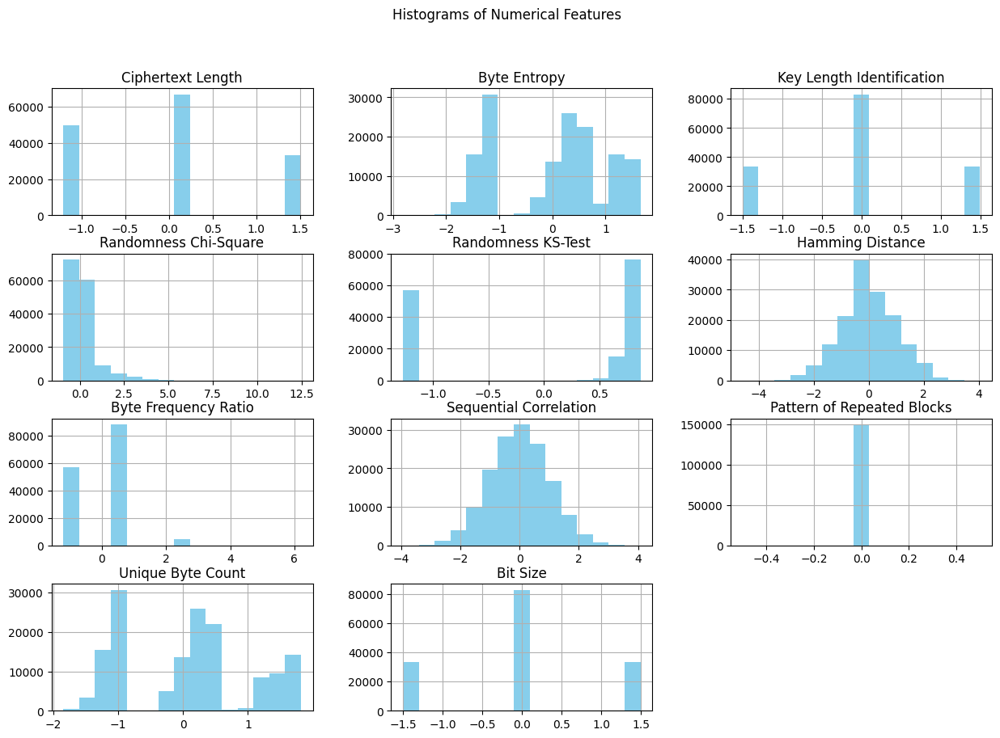

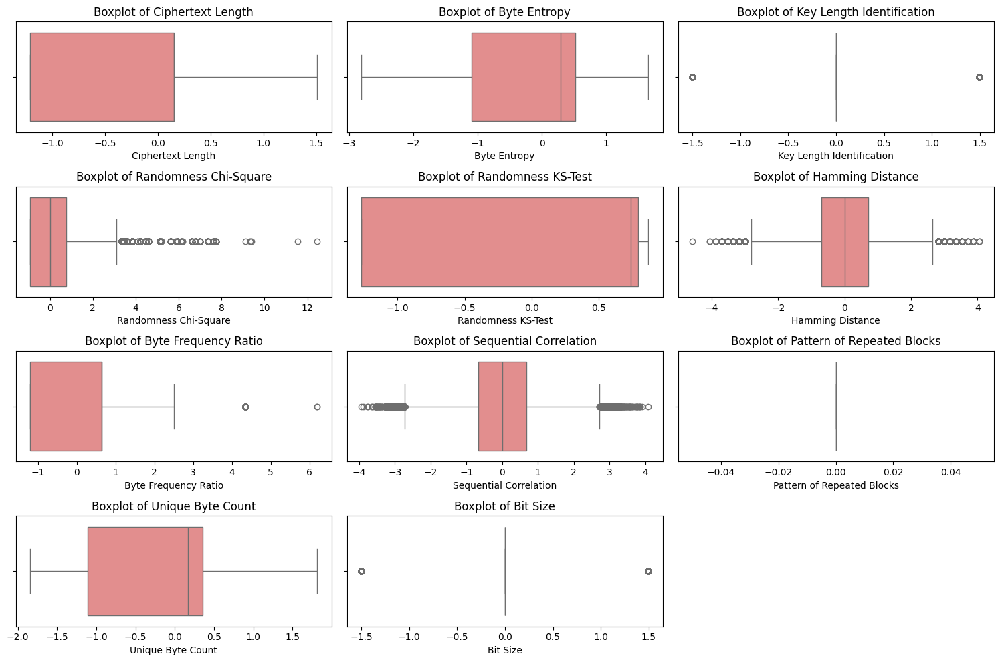

In [11]:
# Histograms for numerical features
df[numerical_features].hist(bins=15, figsize=(15, 10), layout=(4, 3), color='skyblue')
plt.suptitle('Histograms of Numerical Features')
plt.show()

# Boxplots for numerical features to check for outliers
plt.figure(figsize=(15, 10))
for i, feature in enumerate(numerical_features):
    plt.subplot(4, 3, i+1)
    sns.boxplot(x=df[feature], color='lightcoral')
    plt.title(f'Boxplot of {feature}')
plt.tight_layout()
plt.show()


In [13]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots


In [14]:
fig = px.scatter_matrix(numerical_features)
fig.update_layout(title='Scatter Matrix of Numerical Features',
                  width=1000, height=800)
fig.show()

In [15]:


heatmap_fig = go.Figure(data=go.Heatmap(
    z=corr_matrix.values,
    x=corr_matrix.columns,
    y=corr_matrix.index,
    colorscale='Viridis',
    colorbar=dict(title='Correlation Coefficient'),
))

heatmap_fig.update_layout(title='Correlation Matrix of Numerical Features',
                          xaxis_title='Features',
                          yaxis_title='Features',
                          width=800, height=800)
heatmap_fig.show()

In [19]:
 #4. Distribution of 'Byte Entropy'
entropy_fig = px.histogram(df, x='Byte Entropy', nbins=50,
                           title='Distribution of Byte Entropy',
                           labels={'x': 'Byte Entropy', 'y': 'Count'})

entropy_fig.update_layout(width=800, height=600)
entropy_fig.show()

In [20]:
 #5. Scatter Plot: Ciphertext Length vs Byte Entropy colored by Algorithm
scatter_fig = px.scatter(df, x='Ciphertext Length', y='Byte Entropy', color='Algorithm',
                         title='Ciphertext Length vs Byte Entropy by Algorithm')

scatter_fig.update_layout(width=800, height=600)
scatter_fig.show()

In [22]:
# 7. Histogram of Key Length Identification
key_length_fig = px.histogram(df, x='Key Length Identification', color='Algorithm',
                              title='Key Length Identification Distribution by Algorithm',
                              labels={'x': 'Key Length Identification', 'y': 'Count'})

key_length_fig.update_layout(width=800, height=600)
key_length_fig.show()

In [23]:
# Save the preprocessed dataset for future use
processed_file_path = 'C:\\Users\\aravs\\Desktop\\CryptographicALGOidentifier'
df.to_csv(processed_file_path, index=False)
print(f"\nPreprocessed dataset saved to {processed_file_path}")



Preprocessed dataset saved to C:\Users\aravs\Desktop\CryptographicALGOidentifier
